#Import Libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#Read Data

In [3]:
data=pd.read_csv("https://raw.githubusercontent.com/siddh012/dataset-/main/fake_bills%20-%20fake_bills.csv")
data

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
0,True,171.81,104.86,104.95,4.52,2.89,112.83
1,True,171.46,103.36,103.66,3.77,2.99,113.09
2,True,172.69,104.48,103.50,4.40,2.94,113.16
3,True,171.36,103.91,103.94,3.62,3.01,113.51
4,True,171.73,104.28,103.46,4.04,3.48,112.54
...,...,...,...,...,...,...,...
1495,False,171.75,104.38,104.17,4.42,3.09,111.28
1496,False,172.19,104.63,104.44,5.27,3.37,110.97
1497,False,171.80,104.01,104.12,5.51,3.36,111.95
1498,False,172.06,104.28,104.06,5.17,3.46,112.25


In [4]:
data.describe()

,diagonal,height_left,height_right,margin_low,margin_up,length
count,1500.000000,1500.000000,1500.000000,1463.000000,1500.000000,1500.00000
mean,171.958440,104.029533,103.920307,4.485967,3.151473,112.67850
std,0.305195,0.299462,0.325627,0.663813,0.231813,0.87273
min,171.040000,103.140000,102.820000,2.980000,2.270000,109.49000
25%,171.750000,103.820000,103.710000,4.015000,2.990000,112.03000
50%,171.960000,104.040000,103.920000,4.310000,3.140000,112.96000
75%,172.170000,104.230000,104.150000,4.870000,3.310000,113.34000
max,173.010000,104.880000,104.950000,6.900000,3.910000,114.44000


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   is_genuine    1500 non-null   bool   
 1   diagonal      1500 non-null   float64
 2   height_left   1500 non-null   float64
 3   height_right  1500 non-null   float64
 4   margin_low    1463 non-null   float64
 5   margin_up     1500 non-null   float64
 6   length        1500 non-null   float64
dtypes: bool(1), float64(6)
memory usage: 71.9 KB


In [6]:
#Value Counts
data['is_genuine'].value_counts()

True     1000
False     500
Name: is_genuine, dtype: int64

In [7]:
data.shape

(1500, 7)

In [8]:
data.dtypes

is_genuine         bool
diagonal        float64
height_left     float64
height_right    float64
margin_low      float64
margin_up       float64
length          float64
dtype: object

In [9]:
#check for duplicates in the dataframe
data.duplicated().sum()

0

In [10]:
data.corr()   #Correlation

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
is_genuine,1.000000,0.132756,-0.379833,-0.485092,-0.783032,-0.606262,0.849285
diagonal,0.132756,1.000000,0.019472,-0.024492,-0.111534,-0.055649,0.097587
height_left,-0.379833,0.019472,1.000000,0.242279,0.302643,0.246522,-0.320863
height_right,-0.485092,-0.024492,0.242279,1.000000,0.391085,0.307005,-0.401751
margin_low,-0.783032,-0.111534,0.302643,0.391085,1.000000,0.431606,-0.666753
margin_up,-0.606262,-0.055649,0.246522,0.307005,0.431606,1.000000,-0.520575
length,0.849285,0.097587,-0.320863,-0.401751,-0.666753,-0.520575,1.000000


In [11]:
data.isna().sum()

is_genuine       0
diagonal         0
height_left      0
height_right     0
margin_low      37
margin_up        0
length           0
dtype: int64

#Handling missing values

In [12]:
x = data[['is_genuine', 'diagonal', 'height_left', 'height_right',
       'margin_up', 'length','margin_low']]
x

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,True,171.81,104.86,104.95,2.89,112.83,4.52
1,True,171.46,103.36,103.66,2.99,113.09,3.77
2,True,172.69,104.48,103.50,2.94,113.16,4.40
3,True,171.36,103.91,103.94,3.01,113.51,3.62
4,True,171.73,104.28,103.46,3.48,112.54,4.04
...,...,...,...,...,...,...,...
1495,False,171.75,104.38,104.17,3.09,111.28,4.42
1496,False,172.19,104.63,104.44,3.37,110.97,5.27
1497,False,171.80,104.01,104.12,3.36,111.95,5.51
1498,False,172.06,104.28,104.06,3.46,112.25,5.17


In [13]:
x=x.dropna()

In [14]:
len(x)

1463

In [15]:
y=data[data.margin_low.isnull()]

In [16]:
len(y)

37

In [17]:
y.columns

Index(['is_genuine', 'diagonal', 'height_left', 'height_right', 'margin_low',
       'margin_up', 'length'],
      dtype='object')

In [18]:
y= y[['is_genuine', 'diagonal', 'height_left', 'height_right',
       'margin_up', 'length']]
y.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length
72,True,171.94,103.89,103.45,3.25,112.79
99,True,171.93,104.07,104.18,3.14,113.08
151,True,172.07,103.80,104.38,3.02,112.93
197,True,171.45,103.66,103.80,3.62,113.27
241,True,171.83,104.14,104.06,3.02,112.36


In [19]:
from sklearn.linear_model import LinearRegression

In [20]:
lg = LinearRegression()

In [21]:
a=x.iloc[:,:-1]
b=x['margin_low']

In [22]:
lg.fit(a,b)
ypred=lg.predict(y)

In [23]:
ypred

array([4.06495361, 4.11199026, 4.13400328, 3.99357074, 4.1403993 ,
       4.09428392, 4.07412432, 4.12538999, 4.0807278 , 4.07363322,
       4.11897255, 4.18037978, 4.13648423, 4.05106842, 4.17837685,
       4.22555104, 4.11586845, 4.10284101, 4.08184346, 4.09276238,
       4.11250192, 4.15717623, 4.16028787, 4.12193808, 4.12353555,
       4.19842271, 4.10962313, 4.09696025, 4.13384101, 5.25968515,
       5.264817  , 5.28251853, 5.30206887, 5.20035843, 5.1754678 ,
       5.17345045, 5.24675055])

In [24]:
y['margin_low']=ypred

In [25]:
df=pd.concat([x,y], axis=0)

In [26]:
df = df.reset_index(drop=True)

In [27]:
df.isna().sum()

is_genuine      0
diagonal        0
height_left     0
height_right    0
margin_up       0
length          0
margin_low      0
dtype: int64

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   is_genuine    1500 non-null   bool   
 1   diagonal      1500 non-null   float64
 2   height_left   1500 non-null   float64
 3   height_right  1500 non-null   float64
 4   margin_up     1500 non-null   float64
 5   length        1500 non-null   float64
 6   margin_low    1500 non-null   float64
dtypes: bool(1), float64(6)
memory usage: 71.9 KB


#Multicolinearity Detection and Treatment

<function matplotlib.pyplot.show(close=None, block=None)>

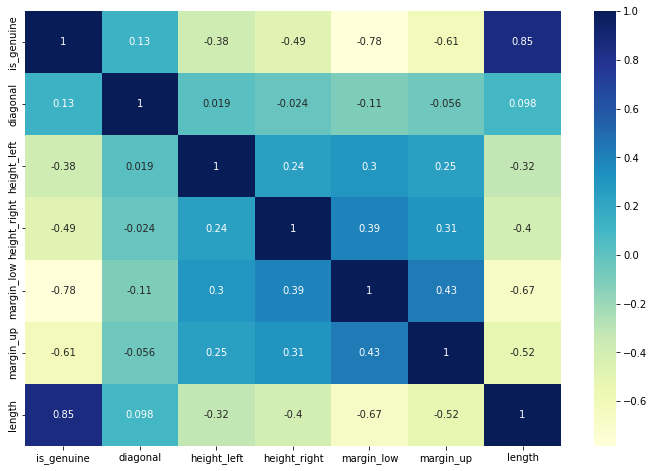

In [29]:
#Correlation using Heatmap
plt.figure(figsize=(12,8))
sns.heatmap(data.corr(), annot=True, cmap='YlGnBu')
plt.show

#Label Encoding

In [30]:
df['is_genuine']=df['is_genuine'].replace({True:1})
df['is_genuine']=df['is_genuine'].replace({False:0})
df

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,1,171.81,104.86,104.95,2.89,112.83,4.520000
1,1,171.46,103.36,103.66,2.99,113.09,3.770000
2,1,172.69,104.48,103.50,2.94,113.16,4.400000
3,1,171.36,103.91,103.94,3.01,113.51,3.620000
4,1,171.73,104.28,103.46,3.48,112.54,4.040000
...,...,...,...,...,...,...,...
1495,0,172.17,104.49,103.76,2.93,111.21,5.302069
1496,0,172.08,104.15,104.17,3.40,112.29,5.200358
1497,0,171.72,104.46,104.12,3.61,110.31,5.175468
1498,0,172.66,104.33,104.41,3.56,111.47,5.173450


In [31]:
data.dtypes            #Check the datatypes

is_genuine         bool
diagonal        float64
height_left     float64
height_right    float64
margin_low      float64
margin_up       float64
length          float64
dtype: object

In [32]:
df.corr()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
is_genuine,1.000000,0.132756,-0.379833,-0.485092,-0.606262,0.849285,-0.786177
diagonal,0.132756,1.000000,0.019472,-0.024492,-0.055649,0.097587,-0.110639
height_left,-0.379833,0.019472,1.000000,0.242279,0.246522,-0.320863,0.308724
height_right,-0.485092,-0.024492,0.242279,1.000000,0.307005,-0.401751,0.390948
margin_up,-0.606262,-0.055649,0.246522,0.307005,1.000000,-0.520575,0.429600
length,0.849285,0.097587,-0.320863,-0.401751,-0.520575,1.000000,-0.668445
margin_low,-0.786177,-0.110639,0.308724,0.390948,0.429600,-0.668445,1.000000


In [33]:
df

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,1,171.81,104.86,104.95,2.89,112.83,4.520000
1,1,171.46,103.36,103.66,2.99,113.09,3.770000
2,1,172.69,104.48,103.50,2.94,113.16,4.400000
3,1,171.36,103.91,103.94,3.01,113.51,3.620000
4,1,171.73,104.28,103.46,3.48,112.54,4.040000
...,...,...,...,...,...,...,...
1495,0,172.17,104.49,103.76,2.93,111.21,5.302069
1496,0,172.08,104.15,104.17,3.40,112.29,5.200358
1497,0,171.72,104.46,104.12,3.61,110.31,5.175468
1498,0,172.66,104.33,104.41,3.56,111.47,5.173450


In [34]:
np.mean(df)

/usr/local/lib/python3.9/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


is_genuine        0.666667
diagonal        171.958440
height_left     104.029533
height_right    103.920307
margin_up         3.151473
length          112.678500
margin_low        4.482844
dtype: float64

In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   is_genuine    1500 non-null   int64  
 1   diagonal      1500 non-null   float64
 2   height_left   1500 non-null   float64
 3   height_right  1500 non-null   float64
 4   margin_up     1500 non-null   float64
 5   length        1500 non-null   float64
 6   margin_low    1500 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 82.2 KB


#Auto EDA

In [112]:
! pip install autoviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.7/64.7 KB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.9/240.9 KB 10.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 36.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 60.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 49.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 68.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 64.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 83.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 59.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 59.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 45.2 MB/

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (1500, 7)
#######################################################################################
######################## C L A S S I

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
length,336,float64,0,0.000000,22.400000,0,
margin_low,285,float64,37,2.466667,19.000000,0,fill missing
height_right,170,float64,0,0.000000,11.333333,0,
diagonal,159,float64,0,0.000000,10.600000,0,
height_left,155,float64,0,0.000000,10.333333,0,
margin_up,123,float64,0,0.000000,8.200000,0,
is_genuine,2,bool,0,0.000000,0.133333,0,


  Printing upto 30 columns max in each category:
    Numeric Columns : ['diagonal', 'height_left', 'height_right', 'margin_low', 'margin_up', 'length']
    Integer-Categorical Columns: []
    String-Categorical Columns: []
    Factor-Categorical Columns: []
    String-Boolean Columns: ['is_genuine']
    Numeric-Boolean Columns: []
    Discrete String Columns: []
    NLP text Columns: []
    Date Time Columns: []
    ID Columns: []
    Columns that will not be considered in modeling: []
    7 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
   Columns to delete:
'   []'
   Boolean variables %s 
"   ['is_genuine']"
   Categorical variables %s 
"   ['is_genuine']"
   Continuous variables %s 
("   ['diagonal', 'height_left', 'height_right', 'margin_low', 'margin_up', "
 "'length']")
   Discrete string variables %s 
'   []'
   Date and time variables %s 
'   []'
   ID variables %s 
'   []'
   Target variable %s 
'   '
Number of

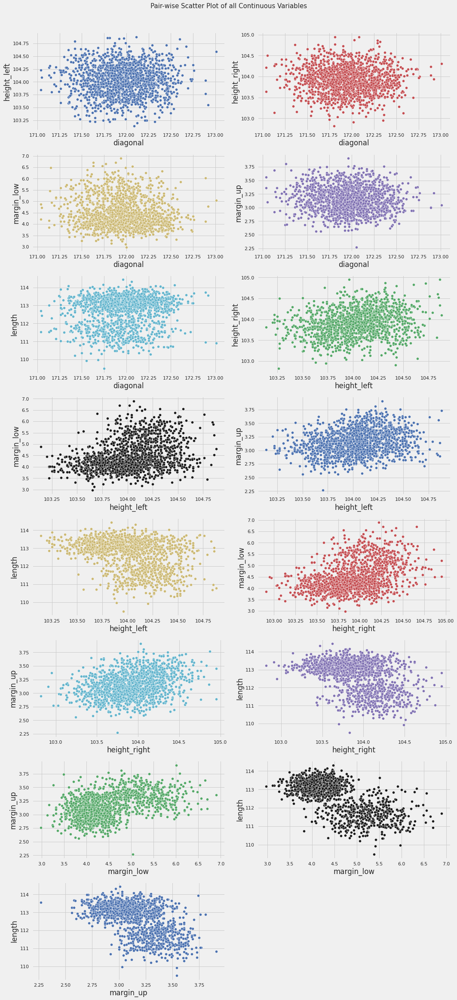

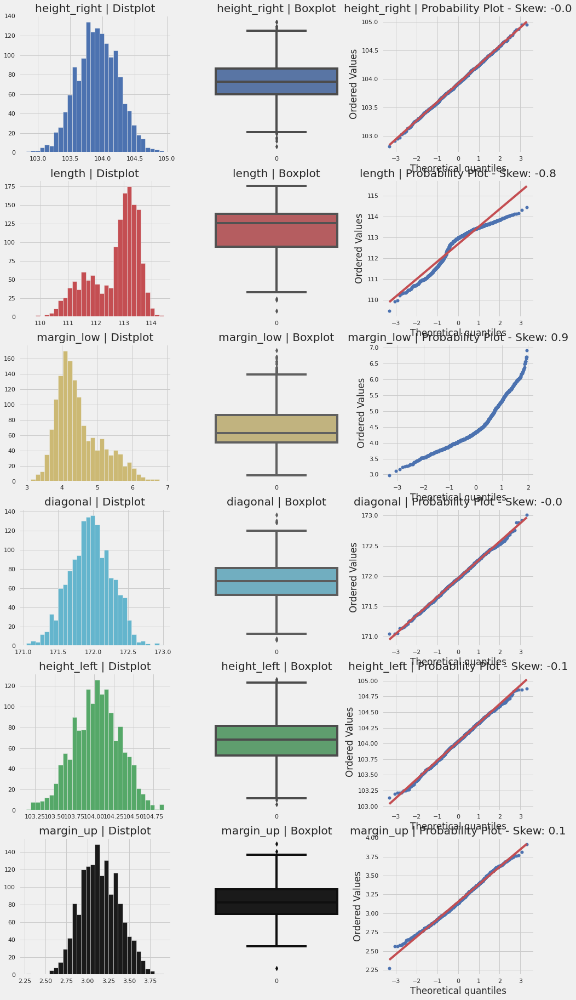

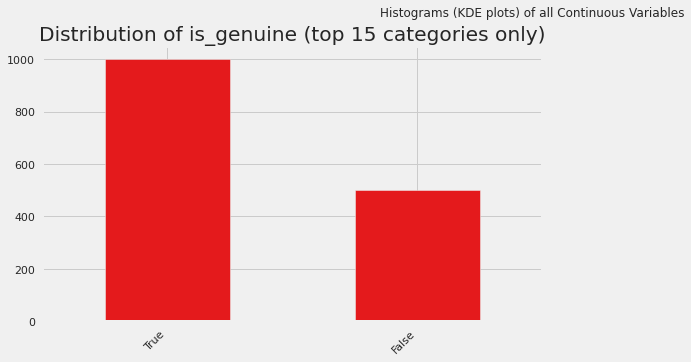

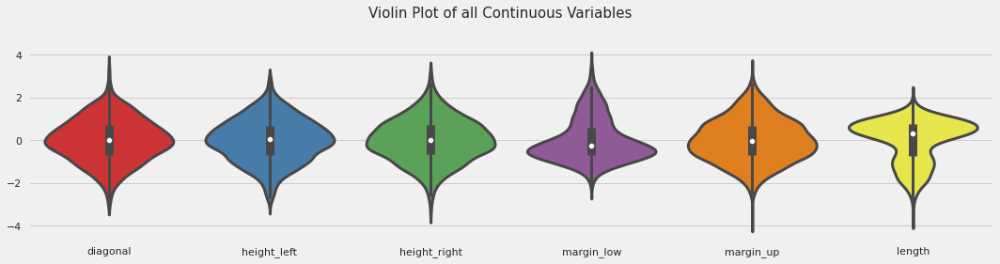

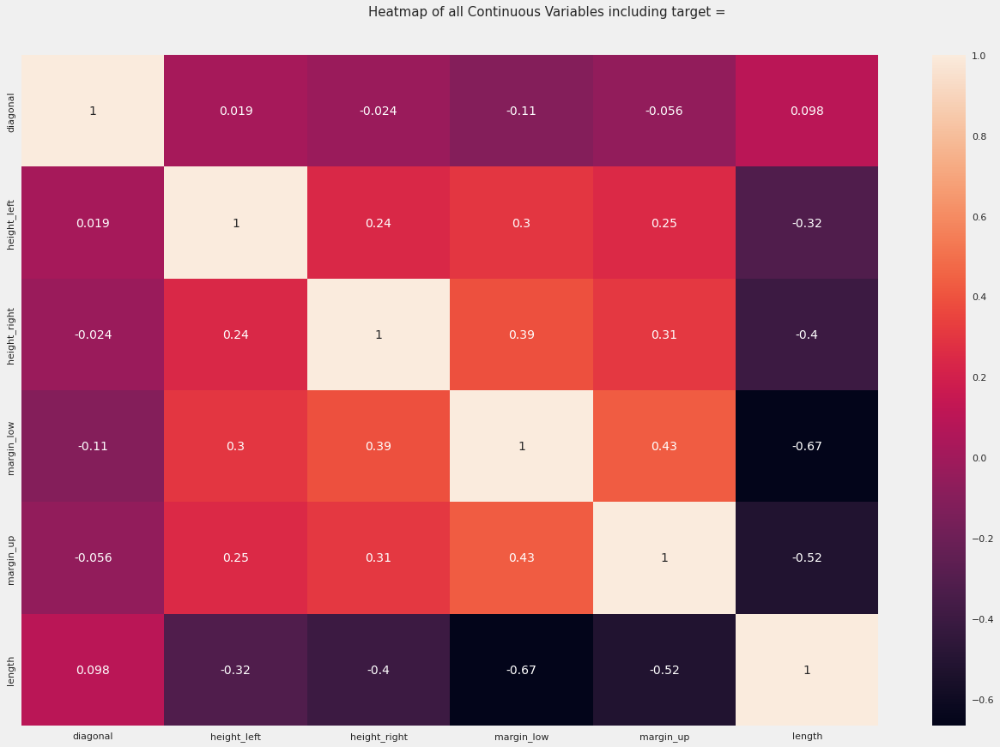

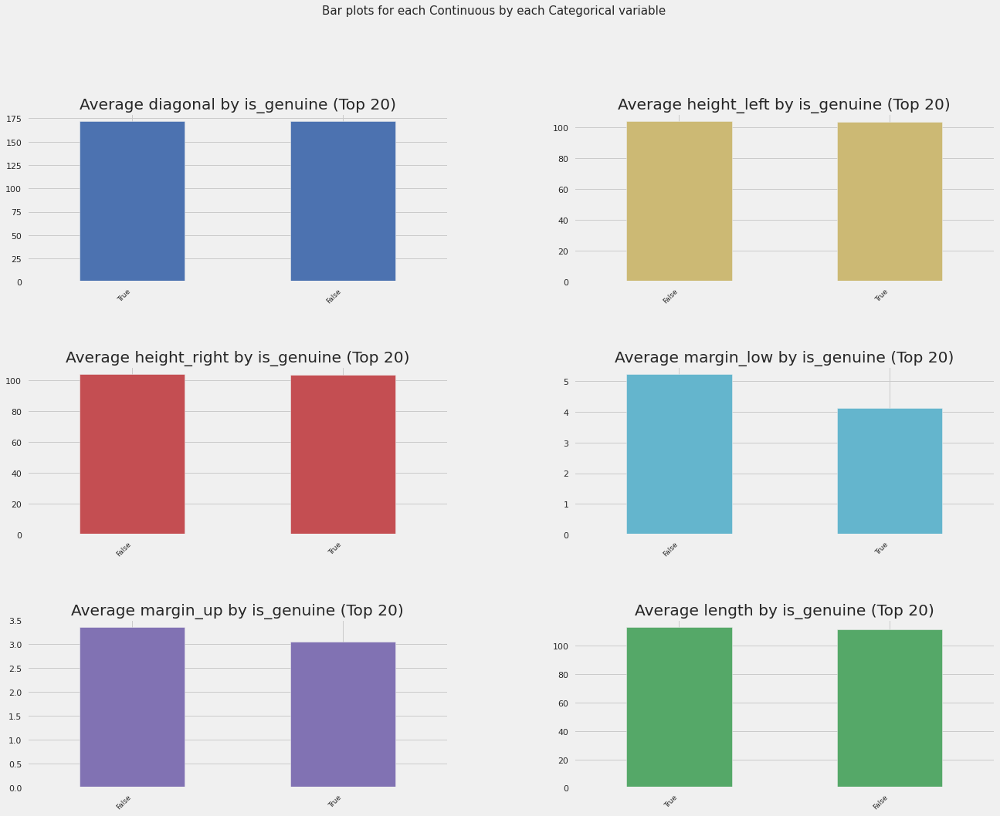

In [113]:
from autoviz.AutoViz_Class import AutoViz_Class

# Instantiate the AutoViz class and generate visualizations
AV = AutoViz_Class()
report = AV.AutoViz(filename="",sep=",", depVar="", dfte=data, header=0, verbose=2, 
                    lowess=False, chart_format='svg', max_rows_analyzed=150000, 
                    max_cols_analyzed=30)

#Visualization

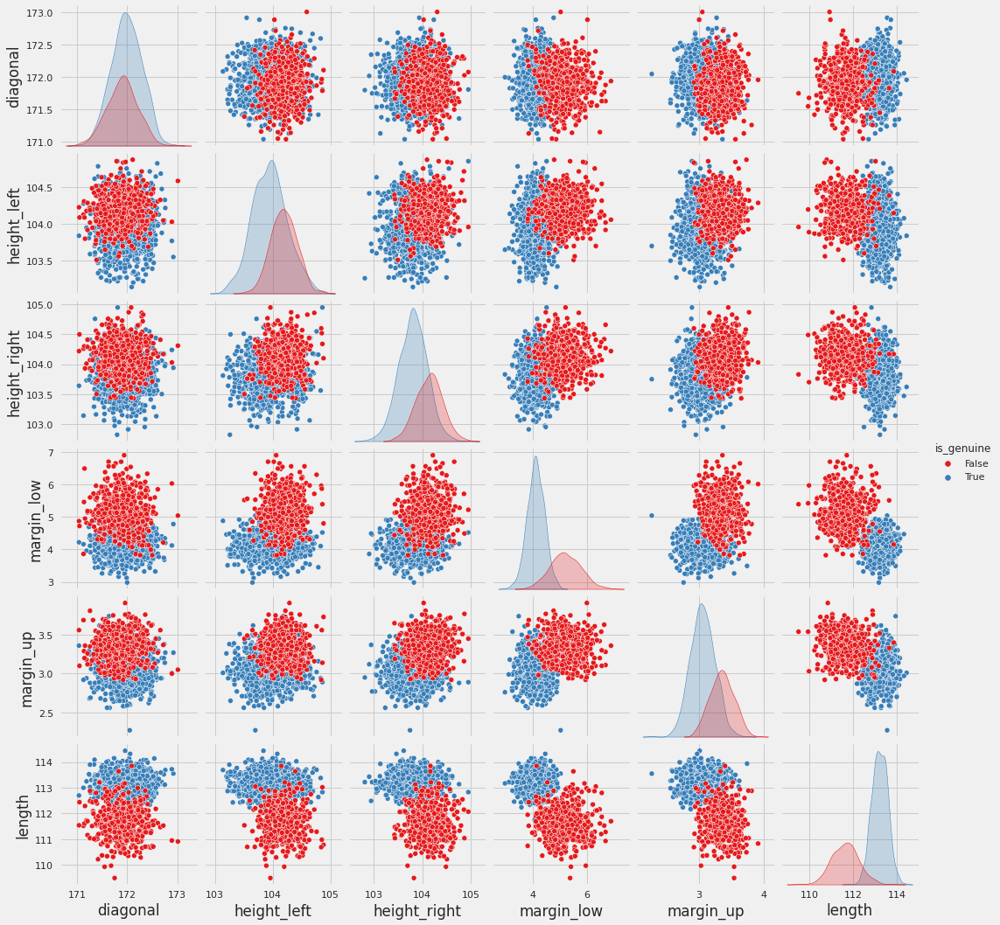

In [114]:
#Here is the pairplot, compare all the col with is_genuine
sns.pairplot(data, hue = "is_genuine")
plt.show()

<function matplotlib.pyplot.show(*, block=None)>

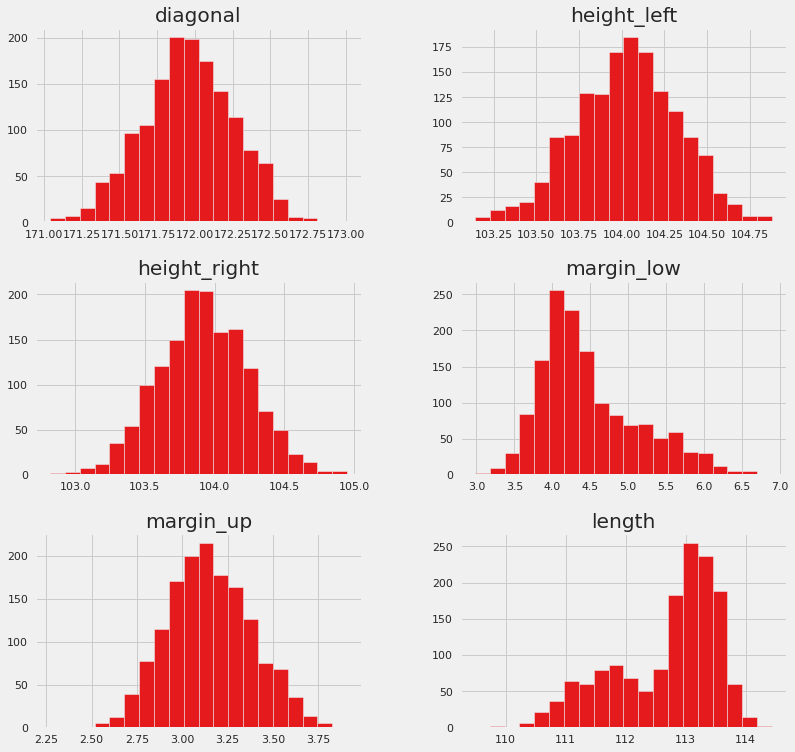

In [115]:
#Here is the Histogram of diff col
data.hist(figsize=(12,12), bins=20)
plt.show

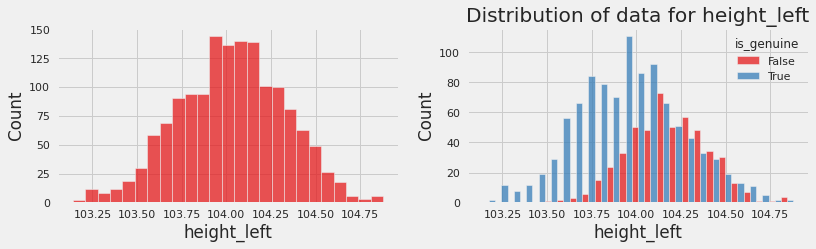

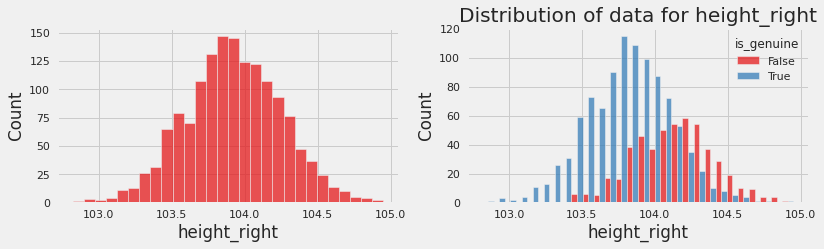

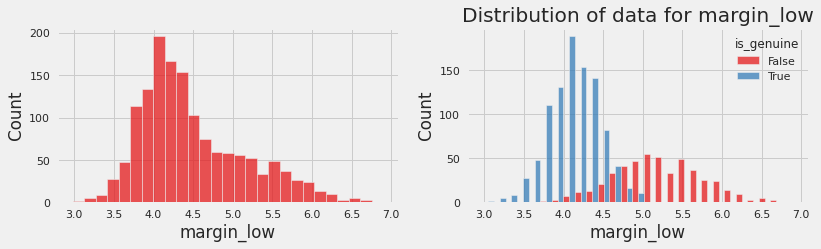

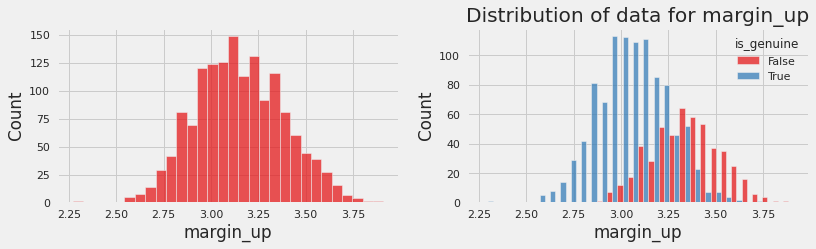

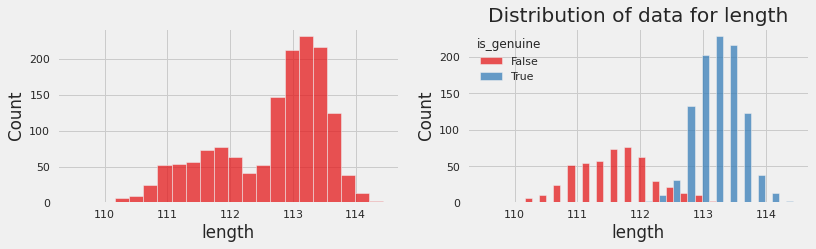

In [116]:
#Here is the histogram and compare it with is_genuine
for col in data.columns[2:]:
    fig, ax = plt.subplots(1,2,figsize=(12,3))
    sns.histplot(data=data, x=col, ax=ax[0])
    sns.histplot(data=data, x=col, hue='is_genuine', ax=ax[1], multiple='dodge',color='Yellow')
    plt.title(f"Distribution of data for {col}")
    plt.show()

#Model Building

In [35]:
# Shuffle the dataset
df = df.reindex(np.random.permutation(data.index))

X = df.drop(columns = "is_genuine")
y = df["is_genuine"]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

from sklearn.preprocessing import StandardScaler
st = StandardScaler()
X_train = st.fit_transform(X_train)

#Logistic Regression

In [36]:
from sklearn.linear_model import LogisticRegression

In [37]:
model = LogisticRegression()
model.fit(X_train,y_train)

pred = model.predict(st.transform(X_test))

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

class_report = classification_report(y_test, pred)
conf_matrix = confusion_matrix(y_test,pred)
acc = accuracy_score(y_test,pred)

print("Classification report:\n\n", class_report)
print("Confusion Matrix\n",conf_matrix)
print("\nAccuracy\n",acc)

results = []
results.append(("LogisticRegression",class_report, conf_matrix, acc))

Classification report:

               precision    recall  f1-score   support

           0       0.98      0.97      0.97        86
           1       0.99      0.99      0.99       214

    accuracy                           0.98       300
   macro avg       0.98      0.98      0.98       300
weighted avg       0.98      0.98      0.98       300

Confusion Matrix
 [[ 83   3]
 [  2 212]]

Accuracy
 0.9833333333333333


#Gaussian Naive Bayes

In [38]:
from sklearn.naive_bayes import GaussianNB

In [39]:
gaussian = GaussianNB()
gaussian.fit(X_train, y_train)
# Predict Output
gauss_predicted = gaussian.predict(X_test)

gauss_score = round(gaussian.score(X_train, y_train) * 100, 2)
gauss_score_test = round(gaussian.score(X_test, y_test) * 100, 2)
print('\n Gaussian Score:= ', gauss_score)
print('\n Gaussian Test Score:= ', gauss_score_test)
print('\n Accuracy:= ', accuracy_score(y_test, gauss_predicted))
print('\n Classification_Report: \n')
print(classification_report(y_test,gauss_predicted))



 Gaussian Score:=  99.25

 Gaussian Test Score:=  28.67

 Accuracy:=  0.2866666666666667

 Classification_Report: 

              precision    recall  f1-score   support

           0       0.29      1.00      0.45        86
           1       0.00      0.00      0.00       214

    accuracy                           0.29       300
   macro avg       0.14      0.50      0.22       300
weighted avg       0.08      0.29      0.13       300



/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but GaussianNB was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but GaussianNB was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_clas

#Random Forrest

In [40]:
from sklearn.ensemble import RandomForestClassifier

In [41]:
rfc = RandomForestClassifier()

rfc.fit(X_train, y_train)

pred = rfc.predict(st.transform(X_test))

class_report = classification_report(y_test, pred)
conf_matrix = confusion_matrix(y_test,pred)
acc = accuracy_score(y_test,pred)

print("Classification report:\n\n", class_report)
print("Confusion Matrix\n",conf_matrix)
print("\nAccuracy\n",acc)

results.append(("RandomForestClassifier",class_report, conf_matrix, acc))

Classification report:

               precision    recall  f1-score   support

           0       1.00      0.98      0.99        86
           1       0.99      1.00      1.00       214

    accuracy                           0.99       300
   macro avg       1.00      0.99      0.99       300
weighted avg       0.99      0.99      0.99       300

Confusion Matrix
 [[ 84   2]
 [  0 214]]

Accuracy
 0.9933333333333333


#Decision Tree

In [42]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

dtc = DecisionTreeClassifier()

dtc.fit(X_train, y_train)

pred = dtc.predict(st.transform(X_test))
# Split your data into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Scale your data using StandardScaler
st = StandardScaler()
X_train = st.fit_transform(X_train)
X_test = st.transform(X_test)

# Create an instance of the DecisionTreeClassifier and fit it to the training data
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

# Make predictions on the test data and evaluate the accuracy of the model
pred = dt.predict(X_test)
class_report = classification_report(y_test, pred)
conf_matrix = confusion_matrix(y_test,pred)
acc = accuracy_score(y_test,pred)

# Print out the classification report, confusion matrix, and accuracy score
print("Classification report:\n\n", class_report)
print("Confusion Matrix\n",conf_matrix)
print("\nAccuracy\n",acc)


Classification report:

               precision    recall  f1-score   support

           0       0.99      0.96      0.97        90
           1       0.98      1.00      0.99       210

    accuracy                           0.98       300
   macro avg       0.98      0.98      0.98       300
weighted avg       0.98      0.98      0.98       300

Confusion Matrix
 [[ 86   4]
 [  1 209]]

Accuracy
 0.9833333333333333


#Neural Network

In [98]:
import tensorflow.keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Activation

In [99]:
model = Sequential()
model.add(Dense(6))
model.add(Dense(10))
model.add(Dense(10))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train,y_train.values, epochs = 50, verbose = 0)

In [100]:
pred = model.predict(st.transform(X_test))
pred = [int(round(t)) for t in pred.reshape(1,-1)[0]]

class_report = classification_report(y_test, pred)
conf_matrix = confusion_matrix(y_test,pred)
acc = accuracy_score(y_test,pred)

print("Classification report:\n\n", class_report)
print("Confusion Matrix\n",conf_matrix)
print("\nAccuracy\n",acc)

results.append(("Neural Network",class_report, conf_matrix, acc))

10/10 [==============================] - 0s 2ms/step
Classification report:

               precision    recall  f1-score   support

           0       0.86      0.95      0.90       100
           1       0.97      0.92      0.95       200

    accuracy                           0.93       300
   macro avg       0.91      0.94      0.92       300
weighted avg       0.93      0.93      0.93       300

Confusion Matrix
 [[ 95   5]
 [ 16 184]]

Accuracy
 0.93


#SVC

In [101]:
from sklearn.svm import SVC

In [102]:
svc = SVC()

svc.fit(X_train, y_train)

pred = svc.predict(st.transform(X_test))

class_report = classification_report(y_test, pred)
conf_matrix = confusion_matrix(y_test,pred)
acc = accuracy_score(y_test,pred)

print("Classification report:\n\n", class_report)
print("Confusion Matrix\n",conf_matrix)
print("\nAccuracy\n",acc)

results.append(("SVC",class_report, conf_matrix, acc))

Classification report:

               precision    recall  f1-score   support

           0       0.00      0.00      0.00       100
           1       0.67      1.00      0.80       200

    accuracy                           0.67       300
   macro avg       0.33      0.50      0.40       300
weighted avg       0.44      0.67      0.53       300

Confusion Matrix
 [[  0 100]
 [  0 200]]

Accuracy
 0.6666666666666666


/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_div

#Bagging

In [94]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Split the dataset into training and testing sets
X = df.drop('is_genuine', axis=1)
y = df['is_genuine']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Decision Tree Classifier
dtc = DecisionTreeClassifier(max_depth=3)

# Create a Bagging Classifier
bagging = BaggingClassifier(base_estimator=dtc, n_estimators=100, random_state=42)

# Fit the Bagging Classifier on the training data
bagging.fit(X_train, y_train)

# Make predictions on the testing data
y_pred_bagging = bagging.predict(X_test)

# Calculate accuracy of Bagging Classifier
accuracy_bagging = accuracy_score(y_test, y_pred_bagging)
print('Bagging Accuracy:', accuracy_bagging)


/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Bagging Accuracy: 0.9766666666666667


#Boosting

In [93]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Split the dataset into training and testing sets
X = df.drop('is_genuine', axis=1)
y = df['is_genuine']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Decision Tree Classifier
dtc = DecisionTreeClassifier(max_depth=3)

# Create an AdaBoost Classifier
adaboost = AdaBoostClassifier(base_estimator=dtc, n_estimators=100, learning_rate=1.0, random_state=42)

# Fit the AdaBoost Classifier on the training data
adaboost.fit(X_train, y_train)

# Make predictions on the testing data
y_pred_adaboost = adaboost.predict(X_test)

# Calculate accuracy of AdaBoost Classifier
accuracy_adaboost = accuracy_score(y_test, y_pred_adaboost)
print('AdaBoost Accuracy:', accuracy_adaboost)


/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


AdaBoost Accuracy: 0.99


#Stacking

In [92]:
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier

# Split the dataset into training and testing sets
X = df.drop('is_genuine', axis=1)
y = df['is_genuine']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create base classifiers
rf = RandomForestClassifier(n_estimators=100, random_state=42)
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Create stacking classifier
estimators = [('rf', rf), ('gb', gb)]
stacking = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())

# Fit stacking classifier on training data
stacking.fit(X_train, y_train)

# Make predictions on testing data
y_pred_stacking = stacking.predict(X_test)

# Calculate accuracy of stacking classifier
accuracy_stacking = accuracy_score(y_test, y_pred_stacking)
print('Stacking Accuracy:', accuracy_stacking)


Stacking Accuracy: 0.9833333333333333


#KMeans with SVD

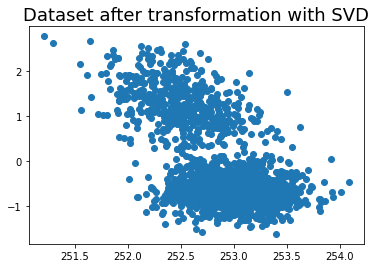

In [48]:
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components = 2, random_state = 0)

transf = svd.fit_transform(X)

plt.scatter(x = transf[:,0], y = transf[:,1])
plt.title("Dataset after transformation with SVD", fontsize = 18)
plt.show()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


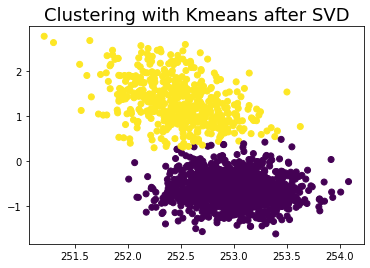

In [49]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters = 2)
c = km.fit_predict(transf)

plt.scatter(x = transf[:,0], y = transf[:,1], c = c)
plt.title("Clustering with Kmeans after SVD", fontsize = 18)
plt.show()

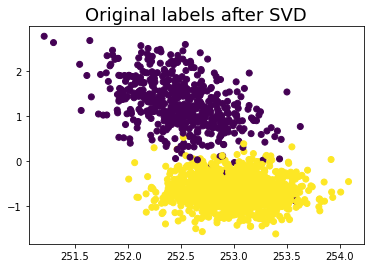

In [50]:
plt.scatter(x = transf[:,0], y = transf[:,1], c = y)
plt.title("Original labels after SVD", fontsize = 18)
plt.show()

#KMeans with PCA

In [51]:
from sklearn.decomposition import PCA

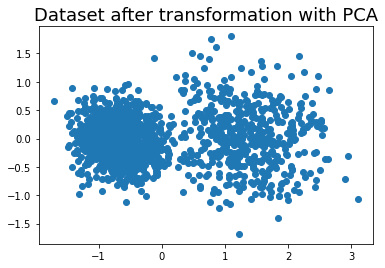

In [52]:
pca = PCA(n_components = 2, random_state = 0)

transf = pca.fit_transform(X)

plt.scatter(x = transf[:,0], y = transf[:,1])
plt.title("Dataset after transformation with PCA", fontsize = 18)
plt.show()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


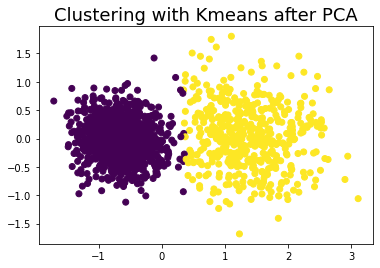

In [53]:
km = KMeans(n_clusters = 2)
c = km.fit_predict(transf)

plt.scatter(x = transf[:,0], y = transf[:,1], c = c)
plt.title("Clustering with Kmeans after PCA", fontsize = 18)
plt.show()

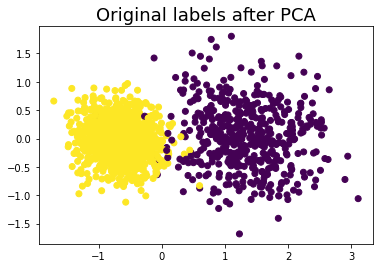

In [54]:
plt.scatter(x = transf[:,0], y = transf[:,1], c = y)
plt.title("Original labels after PCA", fontsize = 18)
plt.show()

/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


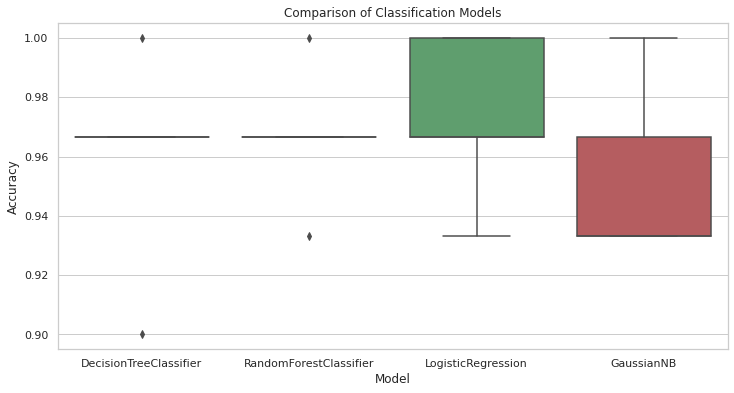

In [55]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.datasets import load_iris

# Load the iris dataset
iris = load_iris()
X = iris.data
y = iris.target

# Define the models to compare
#models = [DecisionTreeClassifier(), RandomForestClassifier(), LogisticRegression(), GaussianNB(), SVC(), PCA()]
models = [DecisionTreeClassifier(), RandomForestClassifier(), LogisticRegression(), GaussianNB(),]
# Evaluate each model using cross-validation
results = []
names = []
for model in models:
    cv_scores = cross_val_score(model, X, y, cv=5)
    results.append(cv_scores)
    names.append(type(model).__name__)

# Plot the results
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="whitegrid")
plt.figure(figsize=(12,6))
ax = sns.boxplot(data=results)
ax.set_xticklabels(names)
ax.set_xlabel("Model")
ax.set_ylabel("Accuracy")
plt.title("Comparison of Classification Models")
plt.show()


In [56]:
model = LogisticRegression()

In [57]:
# training the LogisticRegression model with Training data
model.fit(X_train, y_train)

LogisticRegression()

In [58]:
# accuracy on training data
X_train_prediction = model.predict(X_train)
training_data_accuracy = accuracy_score(X_train_prediction, y_train)

In [59]:
print('Accuracy on Training data : ', training_data_accuracy)

Accuracy on Training data :  0.9925


In [60]:
# accuracy on test data
X_test_prediction = model.predict(X_test)
test_data_accuracy = accuracy_score(X_test_prediction, y_test)

In [61]:
print('Accuracy on Test data : ', test_data_accuracy)

Accuracy on Test data :  0.9933333333333333


#PCA

In [62]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale

In [63]:
df_ary=df.values
df_ary

array([[  1.  , 171.79, 103.65, ...,   3.06, 113.6 ,   4.19],
       [  1.  , 171.9 , 103.94, ...,   2.87, 113.28,   3.67],
       [  0.  , 172.13, 103.67, ...,   3.22, 112.15,   4.27],
       ...,
       [  1.  , 171.57, 103.92, ...,   3.14, 113.45,   4.59],
       [  0.  , 172.09, 104.44, ...,   3.13, 111.93,   4.9 ],
       [  0.  , 171.93, 104.24, ...,   3.16, 111.84,   5.48]])

In [64]:
df_norm=scale(df_ary)
df_norm

array([[ 0.70710678, -0.55209328, -1.26780796, ..., -0.39473107,
         1.05623448, -0.44391933],
       [ 0.70710678, -0.19154792, -0.29908064, ..., -1.21463017,
         0.6894466 , -1.23218106],
       [-1.41421356,  0.56231965, -1.20099918, ...,  0.29571027,
        -0.60577311, -0.32264829],
       ...,
       [ 0.70710678, -1.273184  , -0.36588942, ..., -0.0495104 ,
         0.88430266,  0.16243586],
       [-1.41421356,  0.43121225,  1.37113888, ..., -0.09266298,
        -0.85793978,  0.63236112],
       [-1.41421356, -0.09321736,  0.70305107, ...,  0.03679477,
        -0.96109888,  1.51157614]])

In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500 entries, 702 to 1254
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   is_genuine    1500 non-null   int64  
 1   diagonal      1500 non-null   float64
 2   height_left   1500 non-null   float64
 3   height_right  1500 non-null   float64
 4   margin_up     1500 non-null   float64
 5   length        1500 non-null   float64
 6   margin_low    1500 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 93.8 KB


In [66]:
pca = PCA()
pca_values = pca.fit_transform(df_norm)
pca_values

array([[-1.80549409, -0.97336409, -0.55116585, ..., -0.01347465,
         0.41198879,  0.17014696],
       [-2.28992639, -0.38603119,  0.44421839, ...,  0.45626535,
        -0.53879574,  0.34391679],
       [ 0.5085009 ,  0.01687733, -1.50478951, ...,  0.16941951,
        -0.75405299,  1.02991374],
       ...,
       [-0.61246285, -1.20661463,  0.26646431, ..., -0.36905109,
         0.78543672, -0.26373369],
       [ 2.02029188,  0.8573654 ,  0.73862929, ...,  0.52261386,
        -0.32425835,  0.50591745],
       [ 1.84495332, -0.1256047 ,  0.25990299, ...,  1.17432411,
         0.2229809 ,  0.31521565]])

In [67]:
pca.components_

array([[-0.50899685, -0.07620424,  0.2661919 ,  0.32357918,  0.37380433,
        -0.4695557 ,  0.44647651],
       [ 0.04499549,  0.92906749,  0.33448466,  0.13390666,  0.0128962 ,
         0.03616831, -0.05935964],
       [ 0.09739585, -0.32757802,  0.89193002, -0.04571195, -0.23711206,
         0.14248181, -0.09515642],
       [ 0.08669309, -0.09904067, -0.11859488,  0.91216787, -0.32948767,
         0.14927375, -0.07560104],
       [-0.14354619,  0.11398877, -0.07837131, -0.19688716, -0.80157851,
        -0.22821026,  0.47632595],
       [ 0.11926111,  0.00649198,  0.00499206,  0.00469753,  0.19306567,
         0.68635941,  0.69088643],
       [-0.8288952 ,  0.02957222, -0.03861327, -0.06662659, -0.12456849,
         0.46092995, -0.27956113]])

In [68]:
var = pca.explained_variance_ratio_
var

array([0.49217448, 0.14571506, 0.11274661, 0.10228775, 0.08505188,
       0.04630341, 0.01572082])

In [69]:
Var = np.cumsum(np.round(var,decimals= 4)*100)
Var

array([ 49.22,  63.79,  75.06,  85.29,  93.8 ,  98.43, 100.  ])

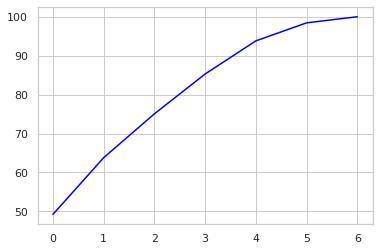

In [70]:
plt.plot(Var,color="blue");

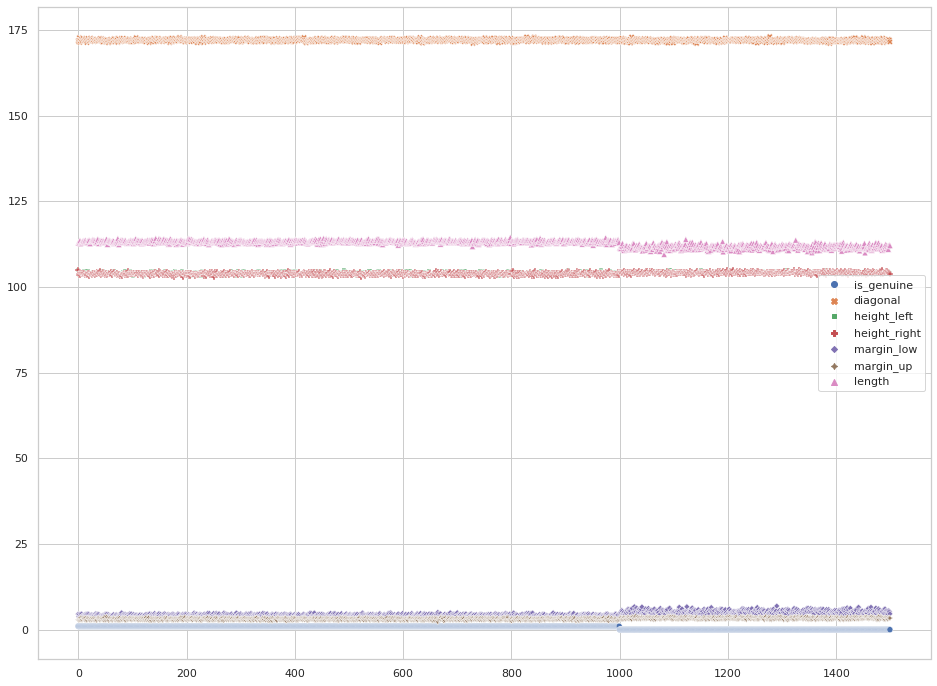

In [71]:
import seaborn as sns
fig=plt.figure(figsize=(16,12))
sns.scatterplot(data=data);

In [72]:
pca_values[: ,0:1]

array([[-1.80549409],
       [-2.28992639],
       [ 0.5085009 ],
       ...,
       [-0.61246285],
       [ 2.02029188],
       [ 1.84495332]])

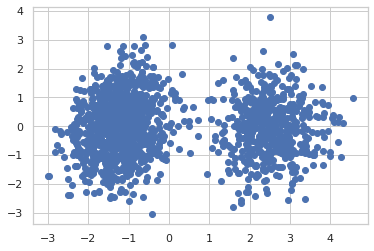

In [73]:
x= pca_values[:,0:1]
y= pca_values[:,1:2]
plt.scatter(x,y);


In [74]:
pca = PCA(n_components=4)
pca_values = pca.fit_transform(df)
pca_values

array([[-1.0491217 ,  0.2565615 , -0.35034492,  0.06149463],
       [-1.09922332, -0.35220019, -0.24390954,  0.15327556],
       [ 0.50023263, -0.47159498, -0.05962096,  0.18202924],
       ...,
       [-0.63512211,  0.5383354 , -0.24375998, -0.32024533],
       [ 1.10583504, -0.02864392,  0.35705071, -0.13924957],
       [ 1.37583928,  0.34211278, -0.16657553,  0.28967026]])

In [75]:
var = pca.explained_variance_ratio_
var

array([0.71259323, 0.10335227, 0.05501435, 0.04934346])

In [76]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize

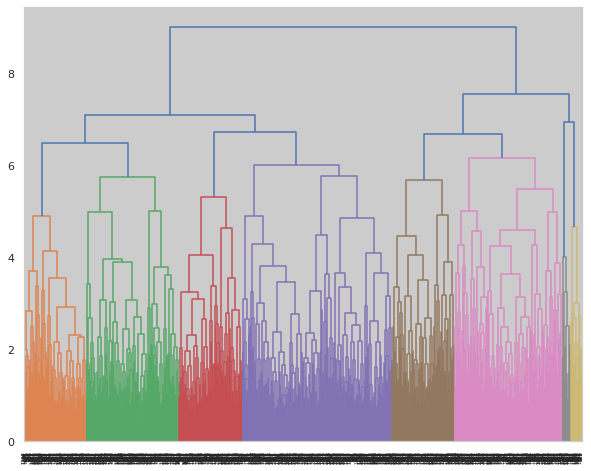

In [77]:
plt.figure(figsize=(10,8))
dendrogram=sch.dendrogram(sch.linkage(df_norm,'complete'))

In [78]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix


# Split your data into training and testing sets
X = df.drop('is_genuine', axis=1) # drop the target variable
y = df['is_genuine']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Scale your data using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply PCA to reduce the number of features
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train a logistic regression model on the transformed data
model = LogisticRegression()
model.fit(X_train_pca, y_train)

# Make predictions on the test data and evaluate the model
y_pred = model.predict(X_test_pca)
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Confusion Matrix:\n", conf_matrix)
print("Accuracy:", accuracy)


Confusion Matrix:
 [[ 94   4]
 [  6 196]]
Accuracy: 0.9666666666666667


#Pipeline

In [79]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# Create a pipeline object with a list of steps
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Step 1: Scale the data
    ('clf', LogisticRegression())  # Step 2: Fit a logistic regression model
])

# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Predict the class labels on the test data
y_pred = pipeline.predict(X_test)

# Evaluate the performance of the pipeline
score = pipeline.score(X_test, y_test)
print("Accuracy score: {:.2f}".format(score))


Accuracy score: 0.99


In [80]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

# Create a pipeline object with a list of steps
pipeline = Pipeline([
    ('scaler', StandardScaler()), # Step 1: Scale the data
    ('pca', PCA(n_components=2)), # Step 2: Perform PCA with 2 components
    ('clf', RandomForestClassifier()) # Step 3: Fit a Random Forest model
])

# Define a dictionary of different classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(),
    'Decision Tree': DecisionTreeClassifier()
}

# Loop through each classifier and fit the pipeline
for name, clf in classifiers.items():
    pipeline.set_params(clf=clf) # Set the classifier
    pipeline.fit(X_train, y_train) # Fit the pipeline on the training data
    score = pipeline.score(X_test, y_test) # Evaluate the performance of the pipeline
    print("Accuracy score for {} classifier: {:.2f}".format(name, score))


Accuracy score for Logistic Regression classifier: 0.97
Accuracy score for Random Forest classifier: 0.96
Accuracy score for SVM classifier: 0.97
Accuracy score for Decision Tree classifier: 0.95


In [81]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
# import some data within sklearn for iris classification
iris = datasets.load_iris()
X = iris.data
y = iris.target

# Splitting data into train and testing part
# The 25 % of data is test size of the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)
# importing pipes for making the Pipe flow
from sklearn.pipeline import Pipeline
# pipe flow is :
# PCA(Dimension reduction to two) -> Scaling the data -> DecisionTreeClassification
pipe = Pipeline([('pca', PCA(n_components = 2)), ('std', StandardScaler()), ('decision_tree', DecisionTreeClassifier())], verbose = True)

# fitting the data in the pipe
pipe.fit(X_train, y_train)

# scoring data
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, pipe.predict(X_test)))


[Pipeline] ............... (step 1 of 3) Processing pca, total=   0.0s
[Pipeline] ............... (step 2 of 3) Processing std, total=   0.0s
[Pipeline] ..... (step 3 of 3) Processing decision_tree, total=   0.0s
0.9473684210526315


In [82]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
# import some data within sklearn for iris classification
iris = datasets.load_iris()
X = iris.data
y = iris.target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

from sklearn.pipeline import Pipeline
pipe = Pipeline([('pca', PCA(n_components = 2)), ('std', StandardScaler()), ('Decision_tree', DecisionTreeClassifier())], verbose = True)

pipe.fit(X_train, y_train)

# to see all the hyper parameters
pipe.get_params()


[Pipeline] ............... (step 1 of 3) Processing pca, total=   0.0s
[Pipeline] ............... (step 2 of 3) Processing std, total=   0.0s
[Pipeline] ..... (step 3 of 3) Processing Decision_tree, total=   0.0s


{'memory': None,
 'steps': [('pca', PCA(n_components=2)),
  ('std', StandardScaler()),
  ('Decision_tree', DecisionTreeClassifier())],
 'verbose': True,
 'pca': PCA(n_components=2),
 'std': StandardScaler(),
 'Decision_tree': DecisionTreeClassifier(),
 'pca__copy': True,
 'pca__iterated_power': 'auto',
 'pca__n_components': 2,
 'pca__n_oversamples': 10,
 'pca__power_iteration_normalizer': 'auto',
 'pca__random_state': None,
 'pca__svd_solver': 'auto',
 'pca__tol': 0.0,
 'pca__whiten': False,
 'std__copy': True,
 'std__with_mean': True,
 'std__with_std': True,
 'Decision_tree__ccp_alpha': 0.0,
 'Decision_tree__class_weight': None,
 'Decision_tree__criterion': 'gini',
 'Decision_tree__max_depth': None,
 'Decision_tree__max_features': None,
 'Decision_tree__max_leaf_nodes': None,
 'Decision_tree__min_impurity_decrease': 0.0,
 'Decision_tree__min_samples_leaf': 1,
 'Decision_tree__min_samples_split': 2,
 'Decision_tree__min_weight_fraction_leaf': 0.0,
 'Decision_tree__random_state': None,


In [83]:
import pickle

In [84]:
filename = 'Fake_Bill_Detection_model.sav'
pickle.dump(model, open(filename, 'wb'))

In [85]:
# loading the saved model
loaded_model = pickle.load(open('Fake_Bill_Detection_model.sav', 'rb'))

In [103]:
import streamlit as st
from streamlit_option_menu import option_menu

ModuleNotFoundError: ignored